## First some quick setup and sanity checks...

In [1]:
from platform import python_version

print(python_version())

3.6.8


In [2]:
!apt-get update

!apt-get install git --yes

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [696 B]
Get:4 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release [564 B]
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Hit:7 http://archive.ubuntu.com/ubuntu bionic InRelease                        
Get:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release.gpg [833 B]
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]      
Get:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Packages [953 kB]
Get:11 https://developer.download.nvidia.co

Processing triggers for mime-support (3.60ubuntu1) ...
Setting up liberror-perl (0.17025-1) ...
Setting up libcurl3-gnutls:amd64 (7.58.0-2ubuntu3.16) ...
Setting up libbsd0:amd64 (0.8.7-1ubuntu0.1) ...
Processing triggers for libc-bin (2.27-3ubuntu1) ...
Setting up libxdmcp6:amd64 (1:1.1.2-3) ...
Setting up openssh-client (1:7.6p1-4ubuntu0.6) ...
Setting up git (1:2.17.1-1ubuntu0.11) ...
Setting up libx11-data (2:1.6.4-3ubuntu0.4) ...
Setting up libxau6:amd64 (1:1.0.8-1ubuntu1) ...
Setting up libxcb1:amd64 (1.13-2~ubuntu18.04) ...
Setting up libx11-6:amd64 (2:1.6.4-3ubuntu0.4) ...
Setting up libxmuu1:amd64 (2:1.1.2-2) ...
Setting up libxext6:amd64 (2:1.3.3-1) ...
Setting up xauth (1:1.0.10-1) ...
Processing triggers for libc-bin (2.27-3ubuntu1) ...


In [3]:
!git clone https://github.com/NVlabs/stylegan2.git # Skip this if you're only using the last section

fatal: destination path 'stylegan2' already exists and is not an empty directory.


In [4]:
!ls stylegan2

Dockerfile	 docs				   run_metrics.py
LICENSE.txt	 epoching_custom_run_projector.py  run_projector.py
README.md	 metrics			   run_training.py
__pycache__	 pretrained_networks.py		   test_nvcc.cu
dataset_tool.py  projector.py			   training
dnnlib		 run_generator.py


In [5]:
import sys
sys.path.append('StyleGan2')

In [5]:
!pip install --upgrade pip # not all of the pip commands in dockerfile behaved right, installing in notebook
!pip install cmake         # for a quick fix
!pip install tqdm
!pip install dlib

## Basic setup is now done, lets generate some faces!

In [7]:
import sys
sys.path.append('stylegan2/')

from stylegan2 import pretrained_networks
from stylegan2 import dnnlib
from stylegan2.dnnlib import tflib

from pathlib import Path
from PIL import Image
import pickle
import numpy as np

import ipywidgets as widgets
from tqdm import tqdm

# model_path = '../stylegan2-ffhq-config-f.pkl'
model_path = 'gdrive:networks/stylegan2-ffhq-config-f.pkl'
fps = 20
results_size = 400

In [8]:
# Code to load the StyleGAN2 Model
def load_model():
    _G, _D, Gs = pretrained_networks.load_networks(model_path)
    
    noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]
    
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    
    return Gs, noise_vars, Gs_kwargs

# Generate images given a random seed (Integer)
def generate_image_random(rand_seed):
    rnd = np.random.RandomState(rand_seed)
    z = rnd.randn(1, *Gs.input_shape[1:])
    tflib.set_vars({var: rnd.randn(*var.shape.as_list()) for var in noise_vars})
    images = Gs.run(z, None, **Gs_kwargs)
    return images, z

# Generate images given a latent code ( vector of size [1, 512] )
def generate_image_from_z(z):
    images = Gs.run(z, None, **Gs_kwargs)
    return images

Will need to download the pretrained face model from Nvidia, the following cell might take a few minutes...

In [9]:
# Loading the StyleGAN2 Model!
Gs, noise_vars, Gs_kwargs = load_model()

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


### The seed value is used to generate different base faces, change and experiment with the value to your liking.

In [10]:
images, latent_code1 = generate_image_random(71)
image1 = Image.fromarray(images[0]).resize((results_size, results_size))
latent_code1.shape

(1, 512)

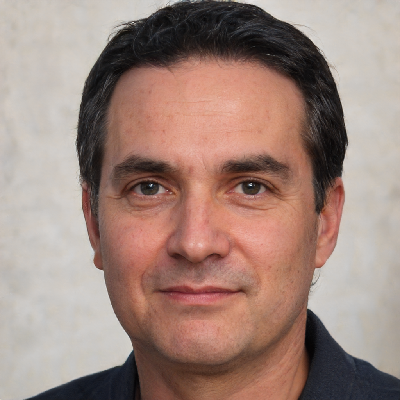

In [11]:
image1

In [12]:
images, latent_code2 = generate_image_random(433)
image2 = Image.fromarray(images[0]).resize((results_size, results_size))
latent_code2.shape

(1, 512)

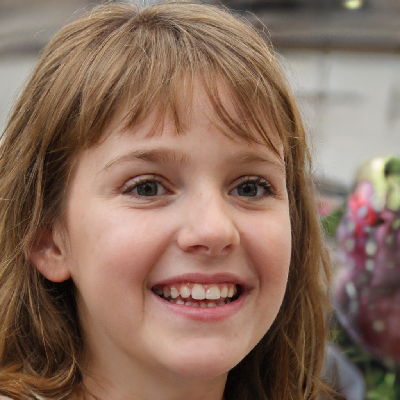

In [13]:
image2

In [14]:
def linear_interpolate(code1, code2, alpha):
    return code1 * alpha + code2 * (1 - alpha)

In [15]:
interpolated_latent_code = linear_interpolate(latent_code1, latent_code2, 0.5)
interpolated_latent_code.shape

(1, 512)

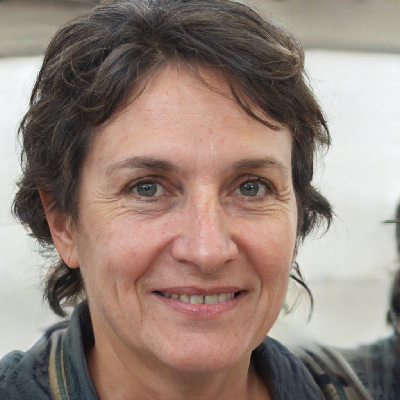

In [16]:
images = generate_image_from_z(interpolated_latent_code)
image3 = Image.fromarray(images[0]).resize((results_size, results_size))
image3

In [17]:
output_gifs_path = Path('output_gifs')
# Make Output Gifs folder if it doesn't exist.
if not output_gifs_path.exists():
    output_gifs_path.mkdir()

In [18]:
def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

def make_latent_interp_animation(code1, code2, img1, img2, num_interps):
    
    step_size = 1.0/num_interps
    
    all_imgs = []
    
    amounts = np.arange(0, 1, step_size)
    
    for alpha in tqdm(amounts):
        interpolated_latent_code = linear_interpolate(code1, code2, alpha)
        images = generate_image_from_z(interpolated_latent_code)
        interp_latent_image = Image.fromarray(images[0]).resize((400, 400))
        frame = get_concat_h(img1, interp_latent_image)
        frame = get_concat_h(frame, img2)
        all_imgs.append(frame)

    save_name = output_gifs_path/'latent_space_traversal.gif'
    all_imgs[0].save(save_name, save_all=True, append_images=all_imgs[1:], duration=1000/fps, loop=0)

In [19]:
make_latent_interp_animation(latent_code1, latent_code2, image1, image2, num_interps=200)

100%|██████████| 200/200 [00:14<00:00, 14.24it/s]


Might need to click into the following cell and rerun to get the gif to show (and for all other "SegmentLocal" cells like this)

![SegmentLocal](output_gifs/latent_space_traversal.gif "segment")

Absolutely extraordinary!

In [5]:
!mkdir generated
!mkdir imgs
image1.save('generated/img1.jpg')
image2.save('generated/img2.jpg')
image3.save('generated/img3.jpg')

### Our created images have been saved to the folder /generated

#### ok, now drop the images you want to try yourself into the imgs/ folder

In [17]:
orig_img_path = Path('imgs')
aligned_imgs_path = Path('aligned_imgs')

# Make Aligned Images folder if it doesn't exist.
if not aligned_imgs_path.exists():
    aligned_imgs_path.mkdir()
    
orig_img_path, aligned_imgs_path

(PosixPath('imgs'), PosixPath('aligned_imgs'))

In [18]:
import urllib.request
url = 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'
filename = 'shape_predictor_68_face_landmarks.dat.bz2'
if not Path('shape_predictor_68_face_landmarks.dat').exists():
    urllib.request.urlretrieve(url, filename)
    !bzip2 -dv shape_predictor_68_face_landmarks.dat.bz2

In [38]:
from align_face import align_face

# Align all of our images using a landmark detection model!
all_imgs = list(orig_img_path.iterdir())
for img in all_imgs:
    align_face(str(img)).save(aligned_imgs_path/('aligned_'+img.name))

Number of faces detected: 1
Detection 0: Left: 553 Top: 451 Right: 1016 Bottom: 913
Part 0: (574, 576), Part 1: (571, 632) ...
Number of faces detected: 1
Detection 0: Left: 348 Top: 400 Right: 810 Bottom: 862
Part 0: (327, 452), Part 1: (325, 517) ...


In [19]:
aligned_img_set = list(aligned_imgs_path.iterdir())
aligned_img_set.sort()
aligned_img_set = [Image.open(x) for x in aligned_img_set]

orig_img_set = list(orig_img_path.iterdir())
orig_img_set.sort()
orig_img_set = [Image.open(x) for x in orig_img_set]

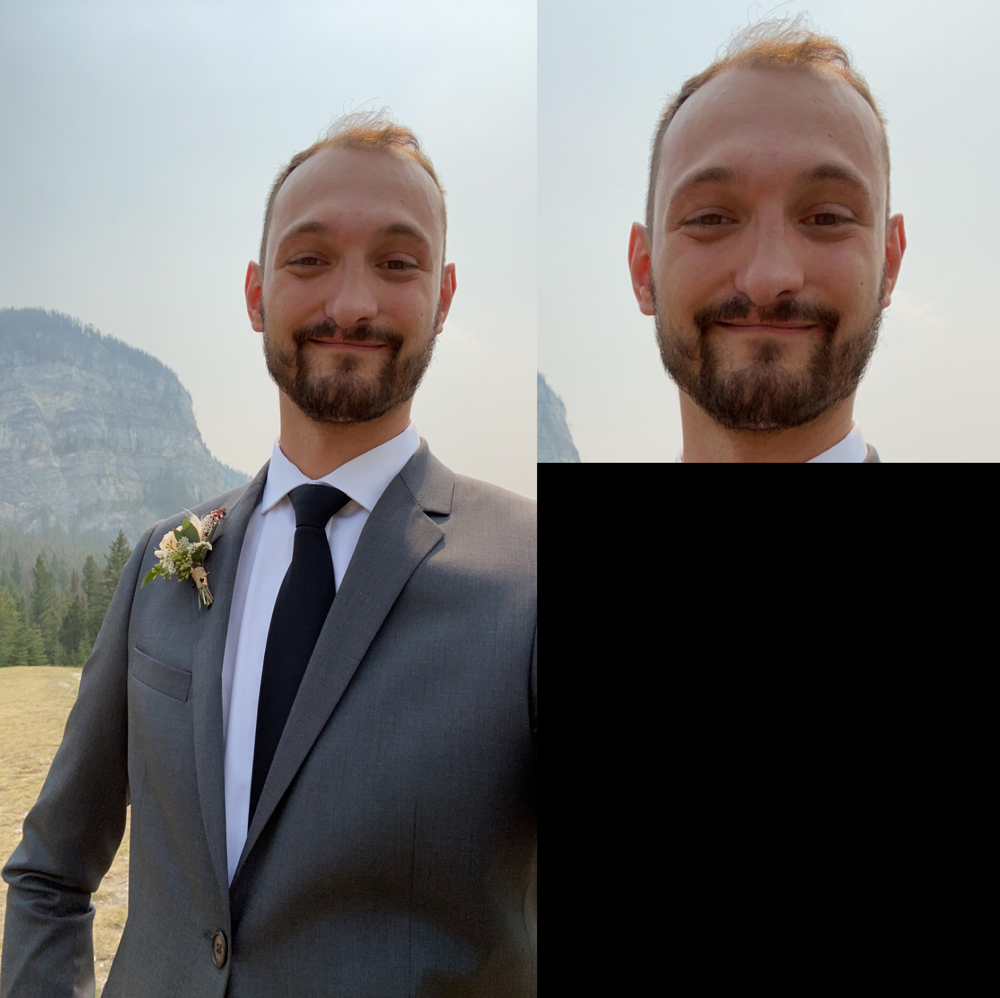

In [20]:
get_concat_h(orig_img_set[0], aligned_img_set[0])

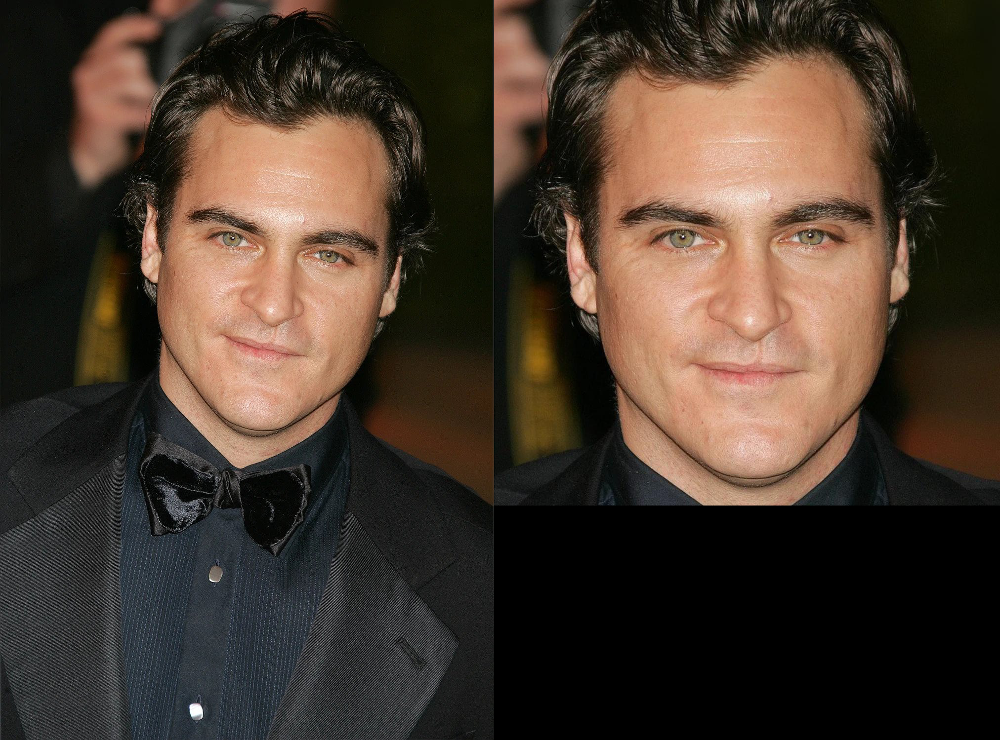

In [21]:
get_concat_h(orig_img_set[1], aligned_img_set[1])

### Now we restart the notebook to clear gpu memory...

In [20]:
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

In [3]:
import sys
sys.path.append('stylegan2/')

from stylegan2 import pretrained_networks
from stylegan2 import dnnlib
from stylegan2.dnnlib import tflib

from pathlib import Path
from PIL import Image
import pickle
import numpy as np

import ipywidgets as widgets
from tqdm import tqdm

model_path = 'gdrive:networks/stylegan2-ffhq-config-f.pkl'
fps = 20
results_size = 400

In [2]:
!python -W ignore stylegan2/dataset_tool.py create_from_images datasets_stylegan2/custom_imgs aligned_imgs/

Loading images from "aligned_imgs/"
Creating dataset "datasets_stylegan2/custom_imgs"
Added 2 images.                         


In [3]:
!cp epoching_custom_run_projector.py stylegan2

In [4]:
tot_aligned_imgs = 2

In [5]:
!python -W ignore stylegan2/epoching_custom_run_projector.py project-real-images --network=$model_path \
  --dataset=custom_imgs --data-dir=datasets_stylegan2 --num-images=$tot_aligned_imgs --num-snapshots 500

Local submit - run_dir: results/00000-project-real-images
dnnlib: Running run_projector.project_real_images() on localhost...
Loading networks from "gdrive:networks/stylegan2-ffhq-config-f.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Loading images from "custom_imgs"...
Projecting image 0/2 ...
0 / 1000 ... 2022-04-26 21:10:46.607262: W tensorflow/core/common_runtime/bfc_allocator.cc:305] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to avoid OOM due to memory fragmentation. If you see this message frequently, you are running near the threshold of the available device memory and re-allocation may incur great performance overhead. You may try smaller batch sizes to observe the performance impact. Set TF_ENABLE_GPU_GARBAGE_COLLECTION=false if you'd like to disable this feature.
Projecting image 1

In [5]:
def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

def make_project_progress_gifs():
    
    all_result_folders = list(Path('results/').iterdir())
    all_result_folders.sort()

    last_result_folder = all_result_folders[-1]
    
    for img_num in range(tot_aligned_imgs):
        all_step_pngs = [x for x in last_result_folder.iterdir() if x.name.endswith('png') and 'image{0:04d}'.format(img_num) in x.name]
        all_step_pngs.sort()

        target_image = Image.open(all_step_pngs[-1]).resize((results_size, results_size))

        all_concat_imgs = []
        for step_img_path in all_step_pngs[:-1]:
            step_img = Image.open(step_img_path).resize((results_size, results_size))
            all_concat_imgs.append(get_concat_h(target_image, step_img))

        all_concat_imgs[0].save('output_gifs/image{0:04d}_project_progress.gif'.format(img_num), save_all=True, append_images=all_concat_imgs[1:], duration=1000/fps, loop=0)

In [7]:
make_project_progress_gifs()

In [6]:
def get_final_latents():
    all_results = list(Path('results/').iterdir())
    all_results.sort()
    
    last_result = all_results[-1]

    latent_files = [x for x in last_result.iterdir() if 'final_latent_code' in x.name]
    latent_files.sort()
    
    all_final_latents = []
    
    for file in latent_files:
        with open(file, mode='rb') as latent_pickle:
            all_final_latents.append(pickle.load(latent_pickle))
    
    return all_final_latents

In [6]:
latent_codes = get_final_latents()
len(latent_codes), latent_codes[0].shape, latent_codes[1].shape

IndexError: list index out of range

For some reason sometimes this does not work properly, it was working just yesterday... oh well

In [10]:
pickle.dump( latent_codes, open('latents.pkl', 'wb'))

In [28]:
latent_codes = pickle.load( open('latents.pkl', 'rb'))

Good thing I saved the latents for these particular images before hand...

## Need to define a few functions since we restarted the kernel to clear GPU memory

In [8]:
def load_model():
    _G, _D, Gs = pretrained_networks.load_networks(model_path)
    
    noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]
    
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    
    return Gs, noise_vars, Gs_kwargs

def generate_image_from_projected_latents(latent_vector):
    images = Gs.components.synthesis.run(latent_vector, **Gs_kwargs)
    return images

In [9]:
Gs, noise_vars, Gs_kwargs = load_model()

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


In [10]:
output_gifs_path = Path('output_gifs/')
aligned_imgs_path = Path('aligned_imgs/')
aligned_img_set = list(aligned_imgs_path.iterdir())
aligned_img_set.sort()
aligned_img_set = [Image.open(x) for x in aligned_img_set]

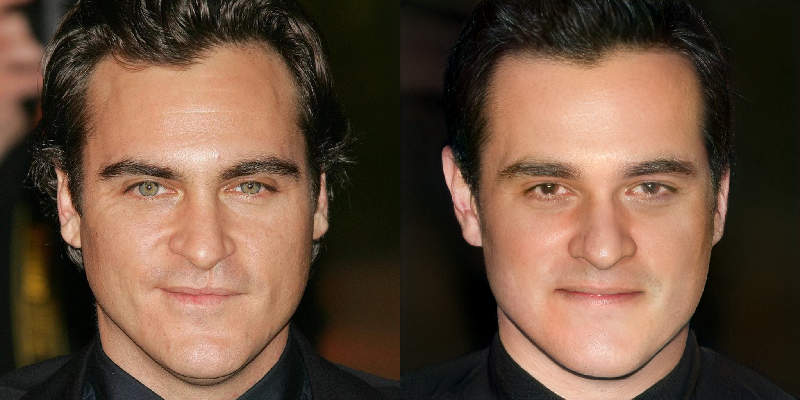

In [11]:
images = generate_image_from_projected_latents(latent_codes[0])
recreated_img1 = Image.fromarray(images[0]).resize((results_size, results_size))

orig_img1 = aligned_img_set[1].resize((results_size, results_size))
get_concat_h(orig_img1, recreated_img1)

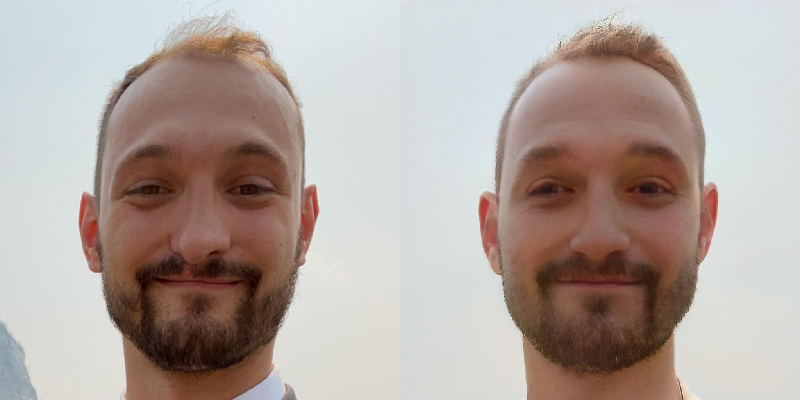

In [12]:
images = generate_image_from_projected_latents(latent_codes[1])
recreated_img2 = Image.fromarray(images[0]).resize((results_size, results_size))

orig_img2 = aligned_img_set[0].resize((results_size, results_size))
get_concat_h(orig_img2, recreated_img2)

![SegmentLocal](output_gifs/image0000_project_progress.gif "segment")

![SegmentLocal](output_gifs/image0001_project_progress.gif "segment")

In [11]:
def linear_interpolate(code1, code2, alpha):
    return code1 * alpha + code2 * (1 - alpha)

def make_latent_interp_animation_real_faces(code1, code2, img1, img2, num_interps):
    
    step_size = 1.0/num_interps
    
    all_imgs = []
    
    amounts = np.arange(0, 1, step_size)
    
    for alpha in tqdm(amounts):
        interpolated_latent_code = linear_interpolate(code1, code2, alpha)
        images = generate_image_from_projected_latents(interpolated_latent_code)
        interp_latent_image = Image.fromarray(images[0]).resize((400, 400))
        frame = get_concat_h(img2, interp_latent_image)
        frame = get_concat_h(frame, img1)
        all_imgs.append(frame)

    save_name = output_gifs_path/'projected_latent_space_traversal.gif'
    all_imgs[0].save(save_name, save_all=True, append_images=all_imgs[1:], duration=1000/fps, loop=0)

In [12]:
make_latent_interp_animation_real_faces(latent_codes[0], latent_codes[1], recreated_img1, recreated_img2, num_interps=200)

100%|██████████| 200/200 [00:13<00:00, 14.39it/s]


![SegmentLocal](output_gifs/projected_latent_space_traversal.gif "segment")

In [13]:
def get_control_latent_vectors(path):
    files = [x for x in Path(path).iterdir() if str(x).endswith('.npy')]
    latent_vectors = {f.name[:-4]:np.load(f) for f in files}
    return latent_vectors

In [14]:
latent_controls = get_control_latent_vectors('stylegan2directions/')
len(latent_controls), latent_controls.keys(), latent_controls['age'].shape

(16,
 dict_keys(['nose_ratio', 'age', 'pitch', 'lip_ratio', 'eye_distance', 'smile', 'gender', 'mouth_open', 'nose_mouth_distance', 'mouth_ratio', 'eyes_open', 'nose_tip', 'yaw', 'eye_eyebrow_distance', 'roll', 'eye_ratio']),
 (18, 512))

In [15]:
def make_latent_control_animation(feature, start_amount, end_amount, step_size, person):
    
    all_imgs = []
    
    amounts = np.linspace(start_amount, end_amount, abs(end_amount-start_amount)/step_size)
    
    for amount_to_move in tqdm(amounts):
        modified_latent_code = np.array(latent_code_to_use)
        modified_latent_code += latent_controls[feature]*amount_to_move
        images = generate_image_from_projected_latents(modified_latent_code)
        latent_img = Image.fromarray(images[0]).resize((results_size, results_size))
        all_imgs.append(get_concat_h(image_to_use, latent_img))

    save_name = output_gifs_path/'{0}_{1}.gif'.format(person, feature)
    all_imgs[0].save(save_name, save_all=True, append_images=all_imgs[1:], duration=1000/fps, loop=0)

In [16]:
latent_code_to_use = latent_codes[1]
image_to_use = recreated_img2
make_latent_control_animation(feature='age', start_amount=-10, end_amount=10, step_size=0.1, person='richy')

100%|██████████| 200/200 [00:13<00:00, 14.46it/s]


![SegmentLocal](output_gifs/richy_age.gif "segment")

In [27]:
latent_code_to_use = latent_codes[0]
image_to_use = recreated_img1
make_latent_control_animation(feature='age', start_amount=-5, end_amount=10, step_size=0.1, person='joaquin')

100%|██████████| 150/150 [00:10<00:00, 14.42it/s]


![SegmentLocal](output_gifs/joaquin_age.gif "segment")

In [23]:
latent_code_to_use = latent_codes[1]
image_to_use = recreated_img2
make_latent_control_animation(feature='gender', start_amount=-8, end_amount=5, step_size=0.1, person='richy')

100%|██████████| 130/130 [00:09<00:00, 14.04it/s]


![SegmentLocal](output_gifs/richy_gender.gif "segment")

In [19]:
latent_code_to_use = latent_codes[0]
image_to_use = recreated_img1
make_latent_control_animation(feature='gender', start_amount=-11, end_amount=4, step_size=0.1, person='joaquin')

100%|██████████| 150/150 [00:10<00:00, 14.13it/s]


![SegmentLocal](output_gifs/joaquin_gender.gif "segment")

In [20]:
latent_code_to_use = latent_codes[1]
image_to_use = recreated_img2
make_latent_control_animation(feature='smile', start_amount=-1, end_amount=5, step_size=0.1, person='richy')

100%|██████████| 60/60 [00:04<00:00, 14.18it/s]


![SegmentLocal](output_gifs/richy_smile.gif "segment")

In [21]:
latent_code_to_use = latent_codes[0]
image_to_use = recreated_img1
make_latent_control_animation(feature='smile', start_amount=-1, end_amount=5, step_size=0.1, person='joaquin')

100%|██████████| 60/60 [00:04<00:00, 14.16it/s]


![SegmentLocal](output_gifs/joaquin_smile.gif "segment")

In [1]:
def apply_latent_controls(self):
    
    image_outputs = controller.children[0]
    feature_sliders = controller.children[1]
    
    slider_hboxes = feature_sliders.children[:-2]
    latent_movements = [(x.children[1].value, x.children[0].value) for x in slider_hboxes]

    modified_latent_code = np.array(latent_code_to_use)
    for feature, amount_to_move in latent_movements:
        modified_latent_code += latent_controls[feature]*amount_to_move

    images = generate_image_from_projected_latents(modified_latent_code)
    latent_img = Image.fromarray(images[0]).resize((400, 400))
    
    latent_img_output = image_outputs.children[1]
    with latent_img_output:
        latent_img_output.clear_output()
        display(latent_img)

def reset_latent_controls(self):
    
    image_outputs = controller.children[0]
    feature_sliders = controller.children[1]
    
    slider_hboxes = feature_sliders.children[:-2]
    for x in slider_hboxes:
        x.children[0].value = 0
        
    latent_img_output = image_outputs.children[1]
    with latent_img_output:
        latent_img_output.clear_output()
        display(image_to_use)

def create_interactive_latent_controller():
    orig_img_output = widgets.Output()

    with orig_img_output:
        orig_img_output.clear_output()
        display(image_to_use)

    latent_img_output = widgets.Output()

    with latent_img_output:
        latent_img_output.clear_output()
        display(image_to_use)

    image_outputs = widgets.VBox([orig_img_output, latent_img_output])

    #collapse-hide
    generate_button = widgets.Button(description='Generate', layout=widgets.Layout(width='75%', height='10%'))
    generate_button.on_click(apply_latent_controls)

    reset_button = widgets.Button(description='Reset Latent Controls', layout=widgets.Layout(width='75%', height='10%'))
    reset_button.on_click(reset_latent_controls)

    feature_sliders = []
    for feature in latent_controls:
        label = widgets.Label(feature)
        slider = widgets.FloatSlider(min=-50, max=50)
        feature_sliders.append(widgets.HBox([slider, label]))
    feature_sliders.append(generate_button)
    feature_sliders.append(reset_button)
    feature_sliders = widgets.VBox(feature_sliders)

    return widgets.HBox([image_outputs, feature_sliders])

In [2]:
latent_code_to_use = latent_codes[0]
image_to_use = recreated_img1

controller = create_interactive_latent_controller()
controller

NameError: name 'latent_codes' is not defined

To switch between either face for interactive feature, comment out the prior run cell and run again, then run the cell you with to play with

In [26]:
# latent_code_to_use = latent_codes[1]
# image_to_use = recreated_img2

# controller = create_interactive_latent_controller()
# controller

## THIS NEXT PART IS FOR GENERATING FACES AND CHANGING VALUES TO USE IN THE NEXT MODEL

In [56]:
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

We will use the encoder made by Robert Luxemburg, its better than the baseline projector supplied in StyleGan2 official repo

In [1]:
!git clone https://github.com/rolux/stylegan2encoder.git

fatal: destination path 'stylegan2encoder' already exists and is not an empty directory.


In [2]:
!pip install tensorflow-gpu==1.14

In [3]:
!pip install keras==2.3.1

It needs to download its own version of the face landmark detection model, and also the pretrained stylegan2 face model, but oh well.... We can skip directly to this section if we just do the quick setup at the top of the notebook

In [54]:
!python stylegan2encoder/align_images.py imgs/ aligned_images/

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn

In [4]:
!python stylegan2encoder/project_images.py aligned_images/ generated/

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 